# Project Proposal

## **Exploring housing prices** 
## *Introduction*

Some of the most expensive real estate in the world is located on the California coast.[1] Over the last several decades, it has become evident that rising sea levels, climate change, and coastal erosion threaten the economic and physical stability of coastal properties.[2,3,4] Research reported by the California Legislative Analyst’s Office states that “over $150 billion of property equating to more than 6% of the state’s GDP and 600,000 people could be impacted by dynamic flooding by 2100”.[2,3] 

There is disagreement among scientists, government organizations, and coastal residents about how to address the situation without sacrificing the value of at-risk properties.[1]
Continued study of the relationship between property value and coastline proximity will be a useful way to gauge the efficacy of whatever measures are implemented, as well as public sentiment. 

We are working with data originally collected from the 1990 California census, containing the variables longitude, latitude, housing_median_age, total_rooms, total_bedrooms, population, households, median_income, median_house_value, and ocean_proximity.

We hope to establish whether or not ocean proximity had an effect on median home value in 1990, by comparing median home prices of inland houses and houses less than one hour away from the ocean. There are extreme values present in this data, so to mitigate their impact on our results, median and IQR will be used as parameters.

Most of the currently available data regarding the relationship between ocean proximity and property value in California has focused on homes situated on or near the immediate coastline.[1] Research shows that the effects of SLR will extend inland beyond the coastal region, and implores policy makers to start planning more aggressively.[2,3,4,5] By using data from the 1990 census in our analysis, we hope to provide a point of reference for future study that encompasses homes outside of the traditional coastal region that still stand to be affected by the impending ecological disruption.

The data we are using is [California housing prices]( https://www.kaggle.com/datasets/camnugent/california-housing-prices
) which can be found by going on the link provided.

![student performance](https://user-images.githubusercontent.com/90440745/140980802-033a00bf-2f76-46d0-b4ad-947bb7379b0d.jpeg)

## *Preliminary Results*


First, we will use the package `tidyverse` in this preliminary analysis. Our dataset `housing.csv` is the California Housing Prices dataset from Kaggle (https://www.kaggle.com/datasets/camnugent/california-housing-prices).
 

In [2]:
library(tidyverse)
housing <- read_csv("housing.csv")
head(housing)

Rows: 20640 Columns: 10
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (1): ocean_proximity
dbl (9): longitude, latitude, housing_median_age, total_rooms, total_bedroom...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
-122.23,37.88,41,880,129,322,126,8.3252,452600,NEAR BAY
-122.22,37.86,21,7099,1106,2401,1138,8.3014,358500,NEAR BAY
-122.24,37.85,52,1467,190,496,177,7.2574,352100,NEAR BAY
-122.25,37.85,52,1274,235,558,219,5.6431,341300,NEAR BAY
-122.25,37.85,52,1627,280,565,259,3.8462,342200,NEAR BAY
-122.25,37.85,52,919,213,413,193,4.0368,269700,NEAR BAY


When we plot the median house value by ocean proximity, we can see that the `INLAND` house values tend to be cheaper, whereas `<1H OCEAN` house values tend to be more expensive.

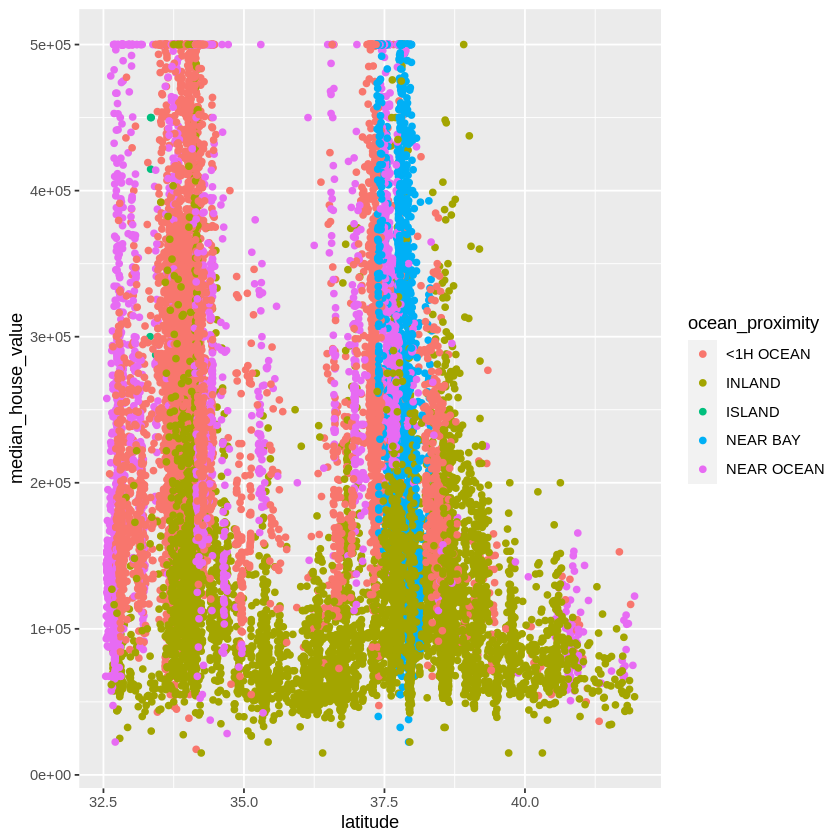

In [3]:
ggplot(housing, aes(x=latitude, y=median_house_value, color=ocean_proximity)) + 
    geom_point()

We can take a deeper look into the difference in median housing prices between inland houses and other houses in California. In this boxplot, we can see that that the inland house value seems much lower than the ones closer to the ocean.

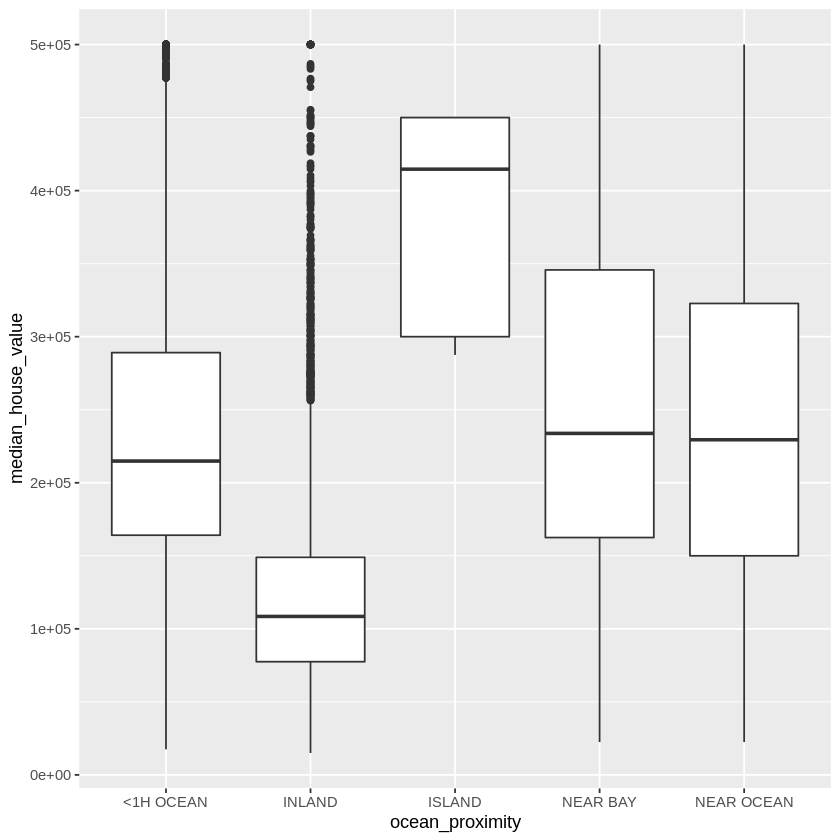

In [4]:
ggplot(housing, aes(x=ocean_proximity, y=median_house_value)) + 
    geom_boxplot()

If we want to compare the median housing price between inland California houses and some other group in `ocean_proximity`, we want to choose ones that have a relatively large number since it will help in decreasing the variance of our sample distribution. When we plot the number of observations in each group, we can see that the `<1H OCEAN` and `INLAND` have very high number of observations compared to the other groups. So, it would be a good idea to focus our project in comparing the median housing price between these two groups.

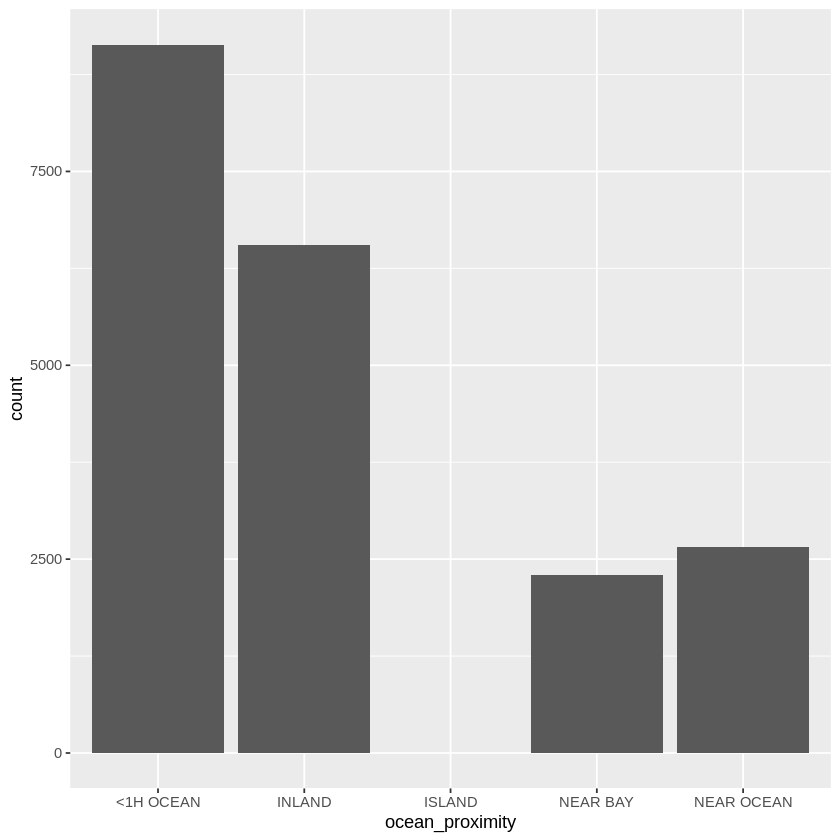

In [5]:
ggplot(housing, aes(x=ocean_proximity)) + 
    geom_bar()

Additionally, we should see whether `<1H OCEAN` and `INLAND` are roughly normally distributed. We know that both groups have at least 6500 samples so we have a large enough sample size, and the population of California is roughly 39 million, so we can be assured that our sample is less than 10% of the population. 

In [6]:
ocean <- housing %>% 
    filter(ocean_proximity == "<1H OCEAN")
inland <- housing %>% 
    filter(ocean_proximity == "INLAND")

nrow(ocean)
nrow(inland)

[1] 9136

[1] 6551

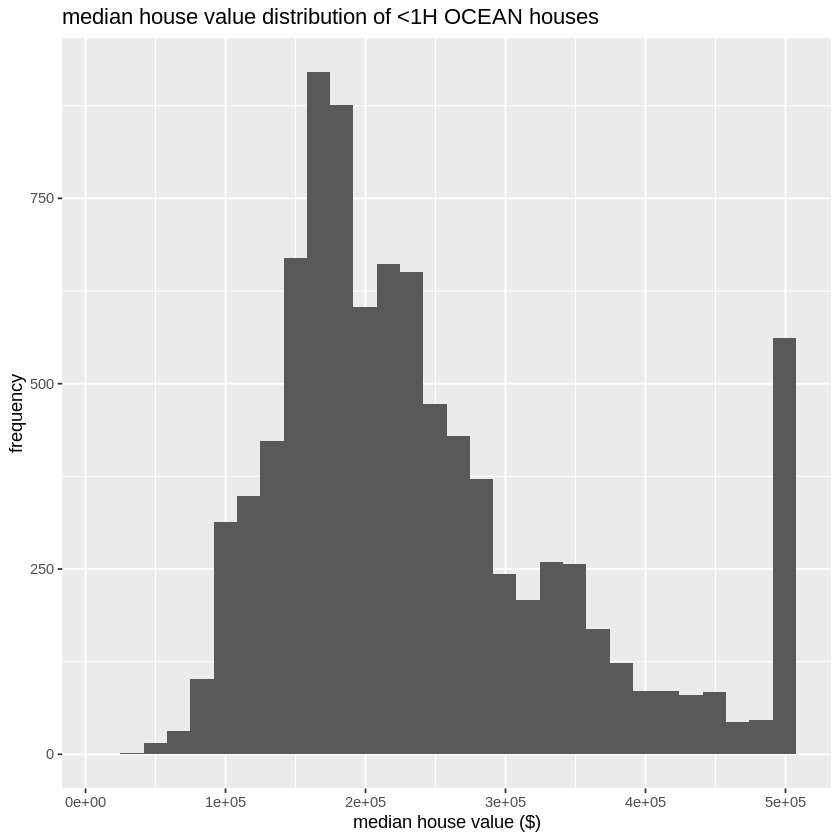

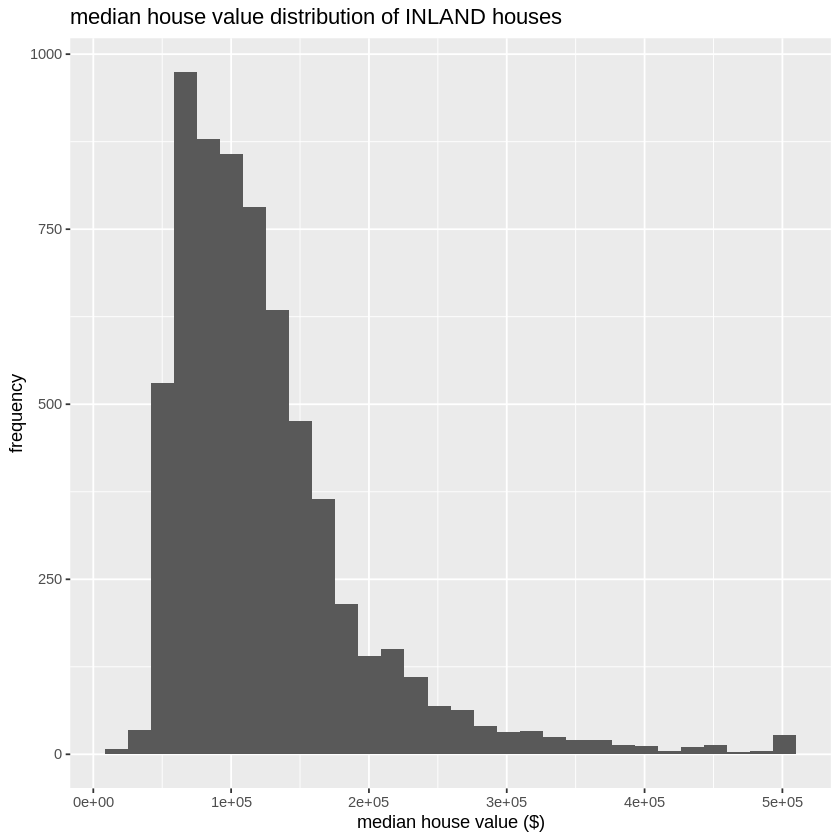

In [7]:
ggplot(ocean, aes(x=median_house_value)) + 
    geom_histogram(bins=30) + 
    labs(x="median house value ($)", y="frequency", title="median house value distribution of <1H OCEAN houses")

ggplot(inland, aes(x=median_house_value)) + 
    geom_histogram(bins=30) +
    labs(x="median house value ($)", y="frequency", title="median house value distribution of INLAND houses")


We can see that the distribution of `<1H OCEAN` houses are roughly normally distributed but bimodal with a peak at around 100,000 dollars and another at 500,000 dollars. However, the distribution of `INLAND` houses are skewed to the right with a peak at 100,100 dollars. Since the sample is not normally distributed, we may have to use bootstrapping to estimate the sampling distribution so that we can use formulae for normal distributions such as the t-test. 

Lastly, let's find estimates for each group:  
- `<1H ocean` has a mean of 240084, median of 214850, and an IQR of 125000.  
- `inland` has a mean of 124805, median of 108500, and an IQR of 71450. 

In [8]:
print("<1H ocean")
summary(ocean$median_house_value)
print("inland")
summary(inland$median_house_value)

[1] "<1H ocean"


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  17500  164100  214850  240084  289100  500001 

[1] "inland"


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  14999   77500  108500  124805  148950  500001 

## *Methods*
This report is trustworthy because firstly the dataset is from a reputable source, the data cleaning and wrangling process is described clearly making it easy to reproduce the reproducible and analysis, the plot and estimates presented will make it easy for stakeholders to understand the findings of our analysis, however they are not enough to prove our hypothesis since we only provide descriptive analysis and no statistical inference. As well, despite the boxplots, the analysis done does not help address how confident we are that we can accept the alternative hypothesis. To address this gap we will provide hypothesis testing and confidence intervals to determine the difference in median housing prices between houses in ocean proximity and houses inland is significant.
** we can perform a two sample t test to construct a confidence interval to get a range of the true difference in median housing prices.

Take a sample & bootstrap it as a repeat analysis


what do we expect to find?
We expect to find that the median house prices in ocean proximity are higher than the median house price inland.

What impact could such findings have?
Our findings can be extremely applicable to real estate market transactions. In particular, it can be used to help price houses for sale. It can also impact buyers because they can now weigh the value of having an ocean-view house with the financial feasibility, all else equal. If we hypothesize that inland houses are indeed cheaper without it being due to sampling variance at a given level of significance, then it will help make the real estate market more transparent.

What future questions could this lead to?
After our analysis, we can further develop the analysis by examining the impact of alternative metrics on median home prices, such as median age of the houses or how many bedrooms they have. As well, we can look into how this relationship has changed over time - has being closer to the ocean widened the gap in recent years? Lastly, we can compare these findings to other coastal states such as Florida or Vancouver. 



## *References (APA)*

[1] Anderson, R. B. (2022). The taboo of retreat: The politics of sea level rise, managed retreat, and coastal property values in California. Economic Anthropology. https://doi.org/10.1002/sea2.12247

[2] What Threat Does Sea-Level Rise Pose to California? (2020). Lao.ca.gov. Retrieved March 15, 2023, from https://lao.ca.gov/Publications/Report/4261#California_Will_Experience_Rising_Seas_and_Tides
‌
[3] Barnard, P. L., Erikson, L. H., Foxgrover, A. C., Hart, J. A. F., Limber, P., O’Neill, A. C., van Ormondt, M., Vitousek, S., Wood, N., Hayden, M. K., & Jones, J. M. (2019). Dynamic flood modeling essential to assess the coastal impacts of climate change. Scientific Reports, 9(1). https://doi.org/10.1038/s41598-019-40742-z
‌
[4] Griggs, G., Davar, L., & Reguero, B. G. (2019). Documenting a Century of Coastline Change along Central California and Associated Challenges: From the Qualitative to the Quantitative. Water, 11(12), 2648. https://doi.org/10.3390/w11122648
‌
[5] State of California Sea-Level Rise Guidance 2018 Update. (2018). Retrieved March 16, 2023, from https://opc.ca.gov/webmaster/ftp/pdf/agenda_items/20180314/Item3_Exhibit-A_OPC_SLR_Guidance-rd3.pdf
